In [1]:
import os
import sys

os.chdir('/home/mk7976/git/gaiablip') # Go to the parents directory
cwd = os.getcwd() # Retrieve directory of current running processes
sys.path.insert(0, cwd) # Change the systxrem path to the current running directory


import dynamics_fcns as df
import dynamics_fcns_for_plot as dfp
import bh_prior_fcns

priors = bh_prior_fcns.BH_priors()

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import corner


dynamics = df.Dynamics()
dynamics_for_plot = dfp.Dynamics()

# import PyMultiNest Solver class
from pymultinest.solve import Solver

In [2]:
plt.rcdefaults()
fontsize = 14
from matplotlib import font_manager
from matplotlib import rcParams
from matplotlib import rc

cmfont = font_manager.FontProperties(fname=mpl.get_data_path() + '/fonts/ttf/cmr10.ttf')
plt.rcParams['font.serif']=cmfont.get_name()
params = {"ytick.color" : "black",
          "xtick.color" : "black",
          "axes.labelcolor" : "black",
          "axes.edgecolor" : "black",
          "font.size" : fontsize,
          "text.usetex" : False,
          "mathtext.fontset" : "cm",
          "font.family" : "serif",
          "font.serif" : [cmfont.get_name()]}
plt.rcParams['axes.unicode_minus']=False
plt.rcParams.update(params)

In [3]:
# Change system path
os.chdir('/home/mk7976/git/gaiablip/analysis/') # Go to the parents directory
cwd = os.getcwd() # Retrieve directory of current running processes
sys.path.insert(0, cwd) # Change the system path to the current running directory
import analysis_fcns as af
dynamics_for_plot = dfp.Dynamics() # Functions for stellar and lens motion                

In [4]:
obs_info = pd.read_csv('./obs_info.csv', sep=",", header=None, skiprows = [0]) # Read observation info csv
obs_info.columns = ['t_obs','scan_angles'] # Specify what each column in obs_info file are
# Extrapolate info from obs_info file
t_obs = obs_info['t_obs'].to_numpy() # Observation times [Julian years]
scan_angles = obs_info['scan_angles'].to_numpy() #  Scan angles [rad]
t_ref = 2017.5 # Reference time for calculating displacement [Julian years]
n_obs = len(t_obs) # Number of observations

In [5]:
truth_list = [[0.0,
  0.0,
  -1.0662662964759078,
  -7.325342428045462,
  0.1540931404954656,
  -51.78180025746282,
  22.601966007078364,
  12.642351368854351,
  -86.41524277707676,
  2.274591571990358,
  7.640326502796289],
 [0.0,
  0.0,
  -1.2651450351695492,
  -3.4917098642843882,
  0.26961180682730324,
  4.298570570287207,
  19.248638716676712,
  11.911586880570006,
  7.288084578112858,
  0.38389414116638826,
  33.5611653504712],
 [0.0,
  0.0,
  4.618876493141252,
  -11.725957084936216,
  0.8292075421069516,
  122.55671105124429,
  -56.0446994913924,
  39.83537303369215,
  -5.539774036462573,
  1.981435824026817,
  10.005985497765144],
 [0.0,
  0.0,
  1.024078816206186,
  -4.275261860198352,
  0.1391957772989944,
  -178.48009524078222,
  -132.45240811425165,
  -9.53978215703407,
  -114.29388172824056,
  2.7752770226190857,
  31.90373460413895],
 [0.0,
  0.0,
  -4.796809809081088,
  -1.1009353530613786,
  0.6528776555455879,
  -0.21333913530851412,
  41.8618421160361,
  19.040556644975787,
  -57.139994221687225,
  1.5370193219349204,
  28.29492383153705],
 [0.0,
  0.0,
  -5.30323,
  -5.284092,
  0.4279039595237087,
  -317.9526749697349,
  -121.17166681426214,
  -7.358669710989107,
  123.065489997895,
  5.576255452200837,
  27.736131773350692]]

In [6]:
scan_angles = np.array([3.448296944257913,3.448296944257913,4.493667318642264,4.493667318642264,3.787273988239316,3.787273988239316,3.4236020095353483,3.4236020095353483,2.661901610522322,2.661901610522322,4.058272401214204,4.058272401214204,2.749441536415439,2.749441536415439,5.603175015853413,5.603175015853413,6.054871697856187,6.054871697856187,2.4092341172487513,2.4092341172487513,4.974555126607196,4.974555126607196,3.3231447888333756,3.3231447888333756,3.5691292400886723,3.5691292400886723,5.815695198095265,5.815695198095265,0.44633271714891726,0.44633271714891726,0.5474495357095673,0.5474495357095673,0.1270359377317719,0.1270359377317719,5.231504780012941,5.231504780012941,4.889303064250705,4.889303064250705,5.466447546932162,5.466447546932162,6.148840389253347,6.148840389253347,5.021261348793251,5.021261348793251,2.899560348474227,2.899560348474227,4.904209452268042,4.904209452268042,0.7431401348347824,0.7431401348347824,4.020742358960453,4.020742358960453,0.9007152691844127,0.9007152691844127,5.935529859755197,5.935529859755197,3.2788697077963755,3.2788697077963755,2.605397808795041,2.605397808795041,1.662251934907694,1.662251934907694,4.864653741776513,4.864653741776513,2.866077065248105,2.866077065248105,3.5715758356335643,3.5715758356335643,0.1180597980265432,0.1180597980265432,3.880718280419711,3.880718280419711,3.8459108515969884,3.8459108515969884,3.8763106246630494,3.8763106246630494,5.9297440606020535,5.9297440606020535,4.284003285463798,4.284003285463798])

In [7]:
blip_search = af.blip_search('bh')
ndim = 11

In [8]:
catalog_list = os.listdir('/scratch/mk7976/epoch_astrometry/lens_new')

In [9]:
sig_catalogs = ['459543-459553','711445-712016','757503-757838','462468-462482','650893-651194','674298-674314']
sig_ids = [4042201774850362496,6262458554071571712,6664358989221213184,4068042664558486272,5727504125199235456,5931325238592343680]

s_id 4042201774850362496
catalog number: 459543-459553


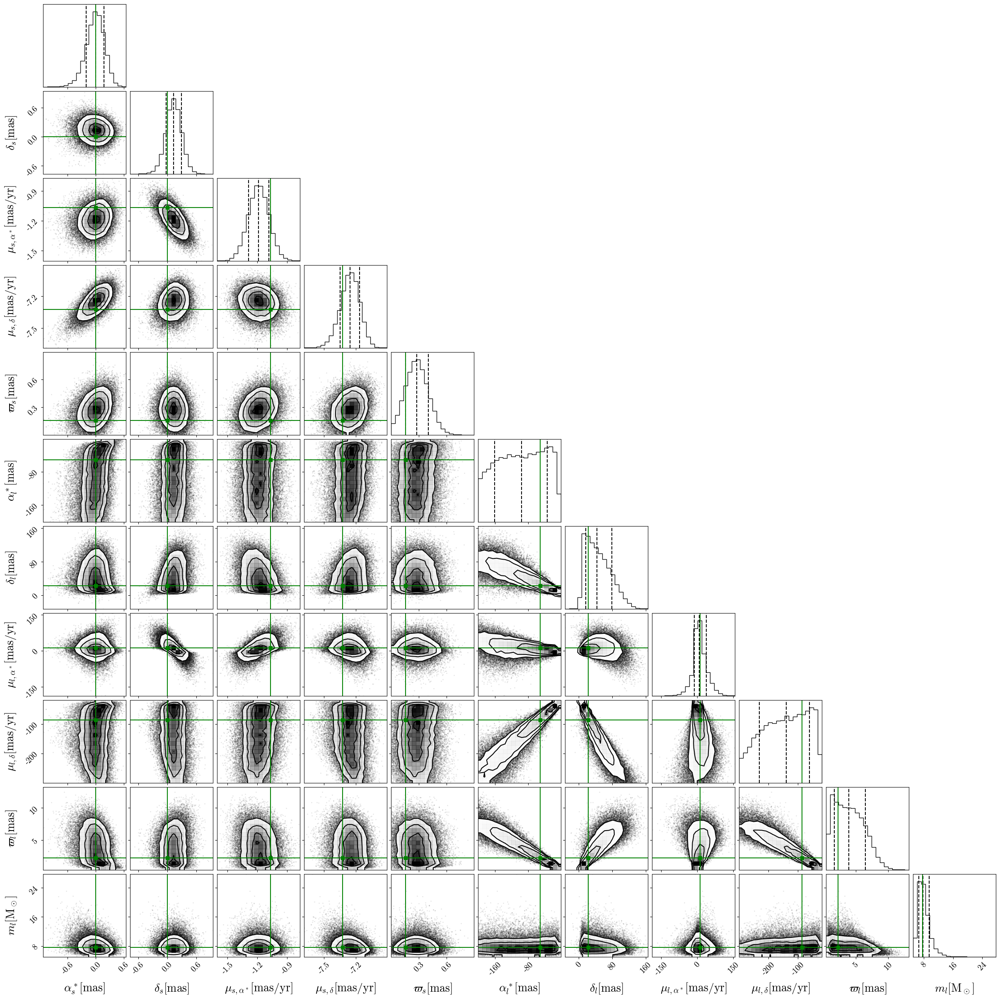

s_id 6262458554071571712
catalog number: 711445-712016


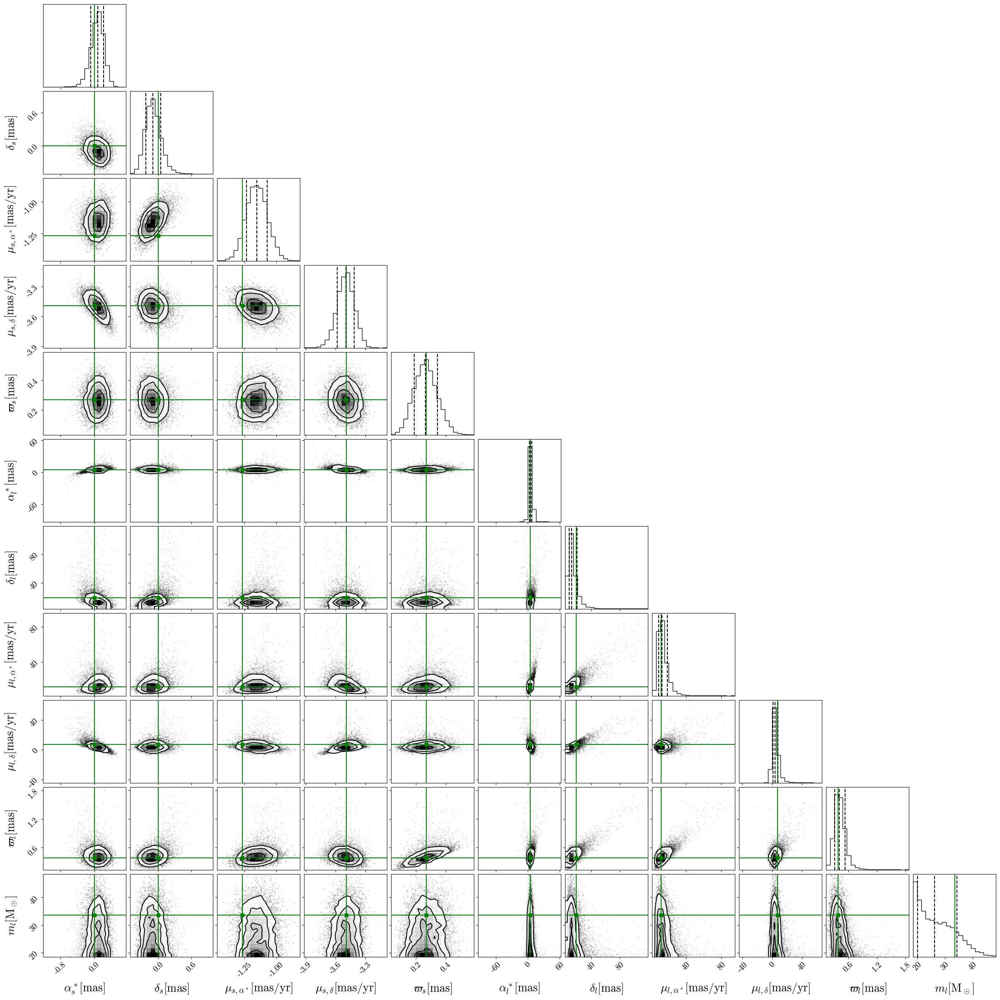

s_id 6664358989221213184
catalog number: 757503-757838


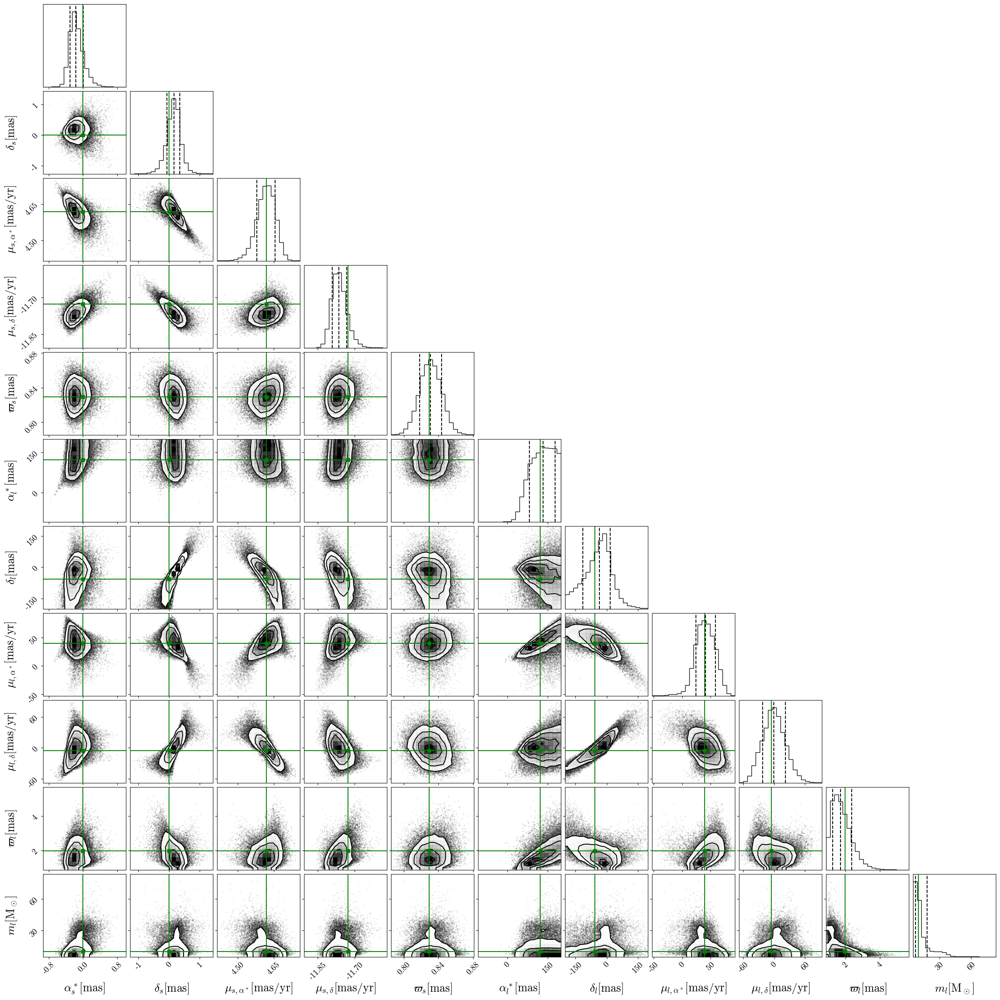

s_id 4068042664558486272
catalog number: 462468-462482


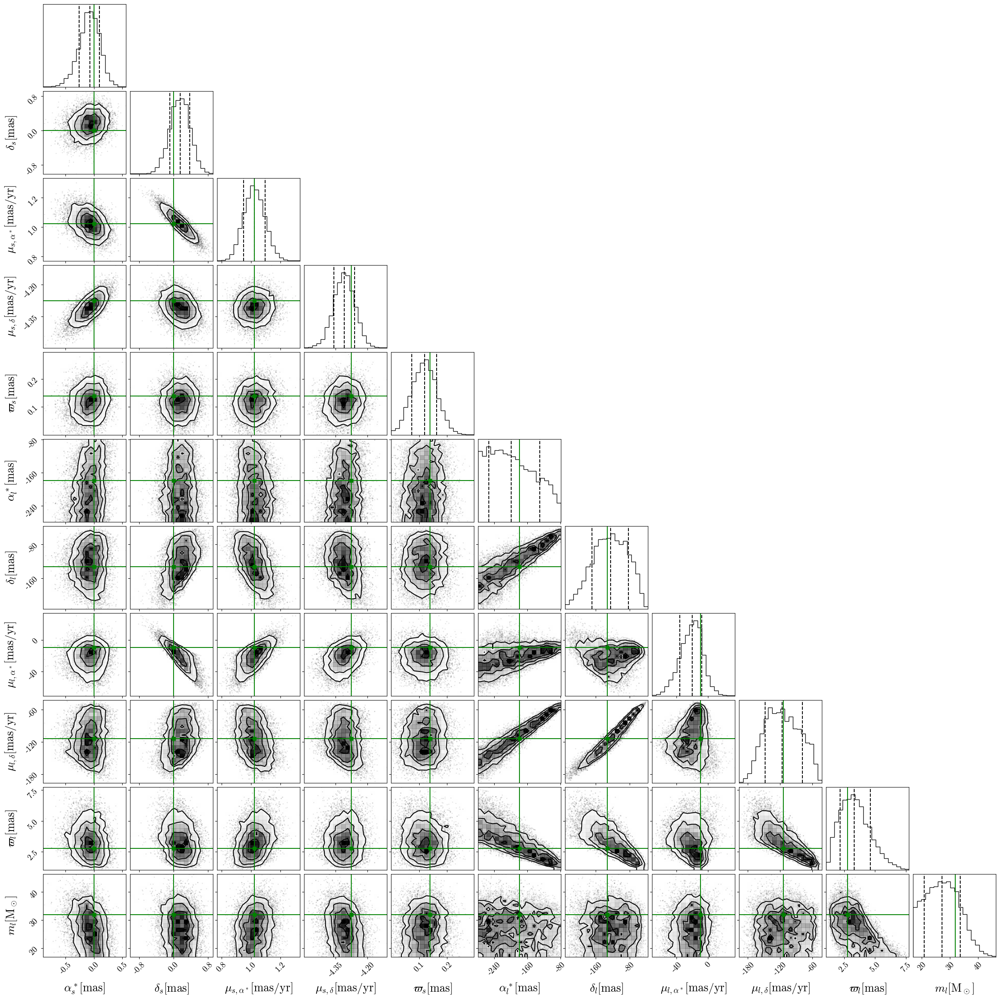

s_id 5727504125199235456
catalog number: 650893-651194


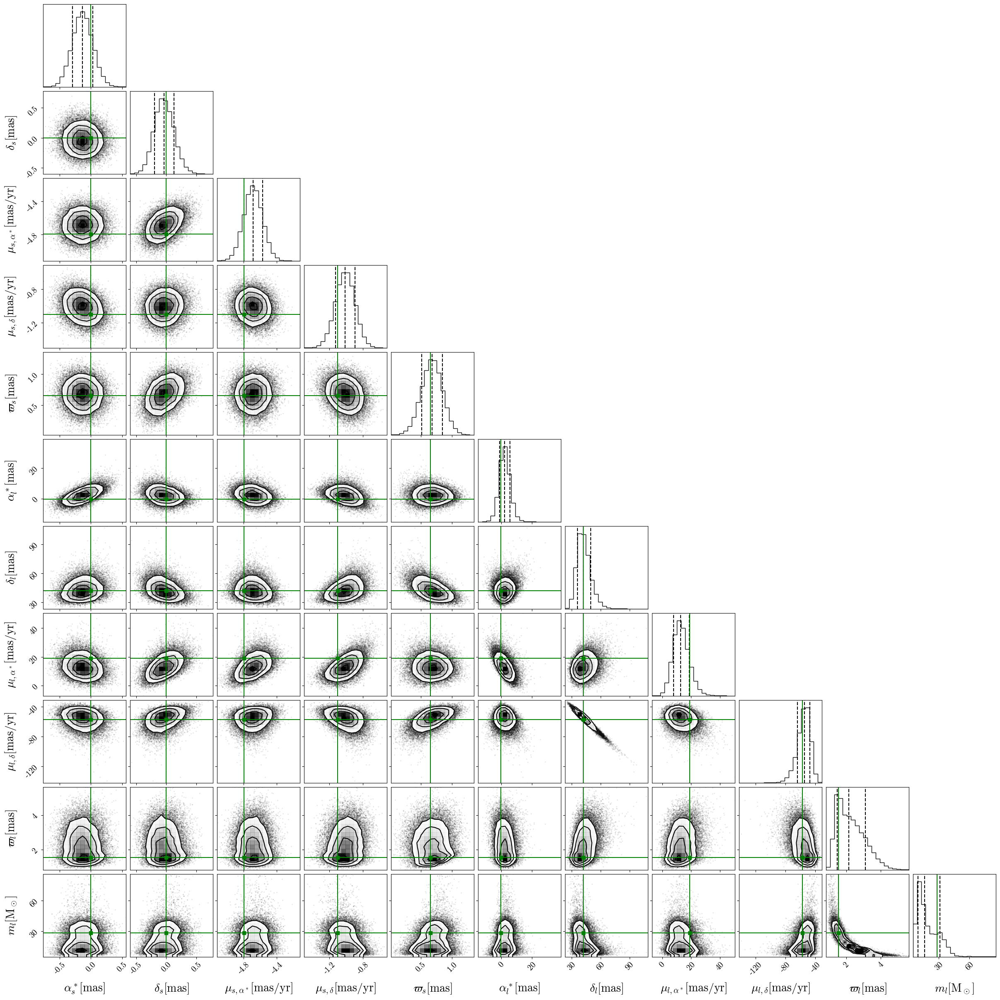

s_id 5931325238592343680
catalog number: 674298-674314


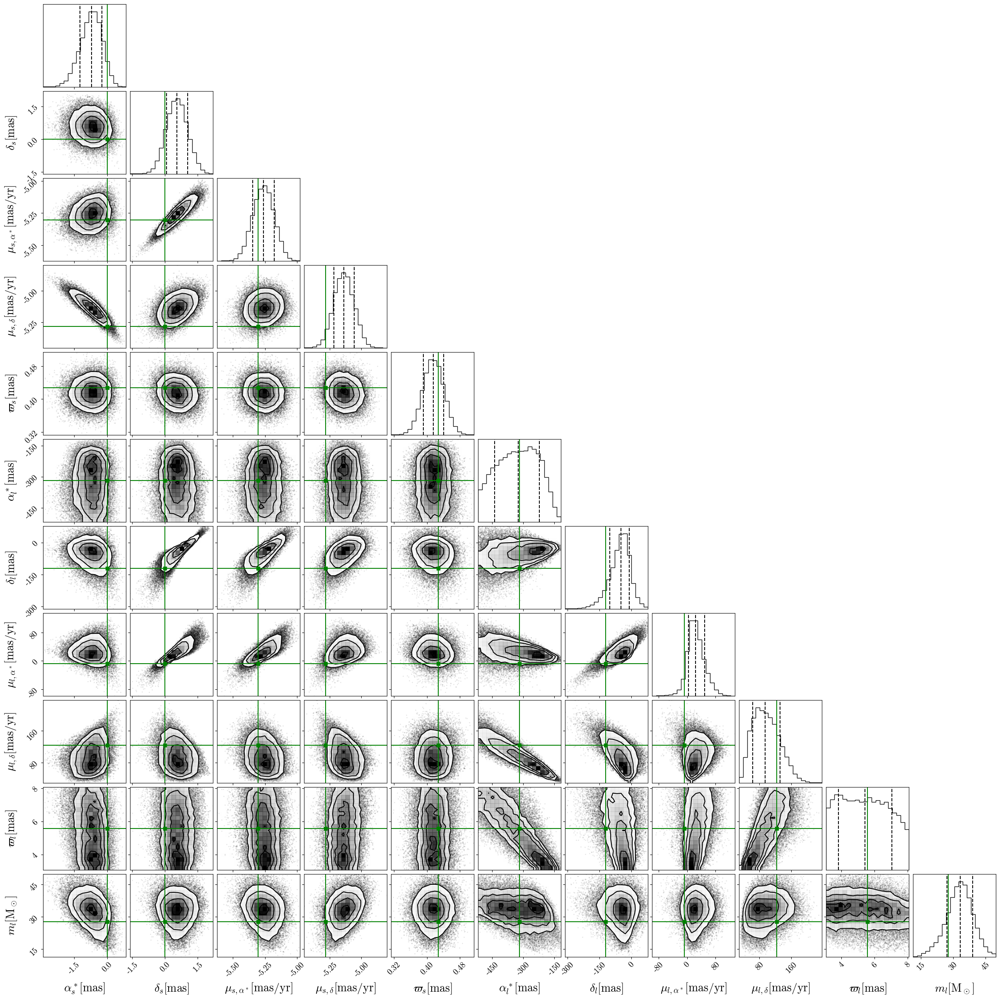

In [10]:
import warnings
warnings.filterwarnings("ignore")

os.chdir('/home/mk7976/git/gaiablip/') # Go to the parents directory
cwd = os.getcwd() # Retrieve directory of current running processes
sys.path.insert(0, cwd) # Change the system path to the current running directory

results_list = os.listdir('/scratch/mk7976/fit_results/x1_new/blip_mcmc_prior_final')
for n,catalog_number in enumerate(sig_catalogs):    
    s_id = sig_ids[n]
    print('s_id',s_id)
    print('catalog number:',catalog_number)
    
    mcmc_data = np.load('/scratch/mk7976/fit_results/x1_new/blip_nested_sampling/final_'+str(s_id)+'.npz')
    
    mcmc = mcmc_data['mcmc']
    
    postsamples = np.vstack((mcmc[:,0],mcmc[:,1],mcmc[:,2],mcmc[:,3],mcmc[:,4],mcmc[:,5],
                            mcmc[:,6],mcmc[:,7],mcmc[:,8],mcmc[:,9],mcmc[:,10])).T
    
               
    fig = corner.corner(postsamples, labels=[r"$\alpha^*_s [\rm mas]$", r"$\delta_s [\rm mas]$",r"$\mu_{s,\alpha^*} [\rm mas/yr]$",r"$\mu_{s,\delta} [\rm mas/yr]$",r"$\varpi_s [\rm mas]$",r"$\alpha^*_l [\rm mas]$", r"$\delta_l [\rm mas]$",r"$\mu_{l,\alpha^*} [\rm mas/yr]$",r"$\mu_{l,\delta} [\rm mas/yr]$",r"$\varpi_{l} [\rm mas]$",r"$m_l [\rm M_\odot]$"],
        label_kwargs=dict(fontsize=20),title_kwargs=dict(fontsize=8),max_n_ticks=3,quantiles=(0.16,0.50, 0.84),show_titles=False)
               
    ############
               
    # This is the true mean of the second mode that we used above:
    value1 = truth_list[n]
    
    # Extract the axes
    axes = np.array(fig.axes).reshape((ndim, ndim))
    
    # Loop over the diagonal
    for i in range(ndim):
        ax = axes[i, i]
        ax.axvline(value1[i], color="g")
    
    # Loop over the histograms
    for yi in range(ndim):
        for xi in range(yi):
            ax = axes[yi, xi]
            ax.axvline(value1[xi], color="g")
            ax.axhline(value1[yi], color="g")
            ax.plot(value1[xi], value1[yi], "sg")
    
    
    fig.savefig('/home/mk7976/git/gaiablip/analysis/plotting/covariance_'+str(s_id)+'_plot.pdf',dpi=500)
    plt.show()